In [1]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import re
import numpy as np
from bs4 import BeautifulSoup
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from tqdm import tqdm  

In [ ]:
from kaggle.api.kaggle_api_extended import KaggleApi

# Initialisation de l'API
api = KaggleApi()
api.authenticate()

# Télécharger le fichier en utilisant le nom du dataset et le fichier spécifique
dataset_name = 'asaniczka/reddit-on-israel-palestine-daily-updated'
file_name = 'data.zip'  # Exemple : 'archive.zip'
destination_path = 'C:/Users/Hay Info/OneDrive - Université Mohammed VI Polytechnique/EMINES CI2/ANALYTIC/Projet Analitics/Data'  # Chemin local de destination

api.dataset_download_files(dataset_name, path=destination_path, unzip=True)
print('Téléchargement terminé.')

Dataset URL: https://www.kaggle.com/datasets/asaniczka/reddit-on-israel-palestine-daily-updated
Téléchargement terminé.


In [ ]:
# Read data from CSV file
real_df = pd.read_csv(r'C:/Users/Hay Info/OneDrive - Université Mohammed VI Polytechnique/EMINES CI2/ANALYTIC/Projet Analitics/Data/reddit_opinion_PSE_ISR.csv')

C:\Users\Hay Info\AppData\Local\Temp\ipykernel_14612\3429561788.py:2: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  real_df = pd.read_csv(r'Data/reddit_opinion_PSE_ISR.csv')


# Data Exploration and Cleaning

In [8]:
real_df.sample(2)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,user_link_karma,user_comment_karma,user_total_karma,post_score,post_self_text,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time
1082196,kyk8zix,1,There have always been kooks doing things for ...,TerrifyingAsFuck,2024-04-08 02:18:19,1byb8uq,blinky12588,0,1,0,...,1008.0,9881.0,11063.0,1293,NaN,Paranormal investigator Lorraine Warren holds ...,0.91,1293,0,2024-04-07 18:21:00
478327,lhlxw68,2,&gt; But the fact that you likened Gaza to an ...,IsraelPalestine,2024-08-11 16:29:05,1eozg94,knign,0,2,0,...,218.0,45893.0,46946.0,101,"What do the people even mean when they say ""[t...","If you're advocating for 2SS, you should ask y...",0.75,101,0,2024-08-10 18:08:29


In [4]:
# display(df.info())
#df.columns
#df.to_csv(r'C:\Users\Hp\OneDrive - Université Mohammed VI Polytechnique\CI2A\SCOLAIRE\S7\Analytics EDGE\PROJET\Palestine\dataFrame.csv', index=False)

In [5]:
"""for i in range(10):
    print(df.self_text[i])
"""

'for i in range(10):\n    print(df.self_text[i])\n'

In [5]:
# !unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/
import zipfile
import os
zip_file_path = 'nltk_data/corpora/wordnet.zip'
destination_directory = 'nltk_data/corpora/'
# Check if the specific file exists in the destination directory
file_to_check = 'index.adv'
file_path_to_check = os.path.join(destination_directory, 'wordnet', file_to_check)
if not os.path.exists(file_path_to_check):
    # Unzip the entire archive if the specific file doesn't exist
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(destination_directory)
    print(f"Successfully unzipped {zip_file_path} to {destination_directory}")
else:
    print(f"File {file_to_check} already exists. No need to unzip the archive.")

File index.adv already exists. No need to unzip the archive.


In [9]:
len(real_df)

2227910

In [41]:
# Trier aléatoirement
df_random = real_df.sample(frac=1, random_state=42)  # `frac=1` mélange toutes les lignes
# Prendre un échantillon aléatoire de n lignes
df_random_sample = real_df.sample(n=10000, random_state=42)  
df_random_sample.head(2)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,user_link_karma,user_comment_karma,user_total_karma,post_score,post_self_text,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time
969577,l1iar2b,57,Her fucking statement makes me sick.,PublicFreakout,2024-04-27 14:56:34,1cefbwj,elboogie7,0,57,0,...,5746.0,102165.0,108190.0,9521,NaN,District Attorney refuses to pull over during ...,0.97,9521,0,2024-04-27 14:06:41
1788577,kd4lsrq,61,What crime is that?,worldnews,2023-12-13 02:39:09,18h3lqi,RevolutionaryDeal238,0,61,0,...,2.0,2630.0,2632.0,791,NaN,IDF moves to dismantle Hamas’ underground tunn...,0.88,791,0,2023-12-13 01:01:15
594469,lcr4hv2,12,"Geez, an injury like that in a major muscle th...",PublicFreakout,2024-07-11 23:21:40,1e0w4ae,Destination_Centauri,0,12,0,...,65025.0,231018.0,312854.0,9289,NaN,Police officer shoots a football player in the...,0.96,9289,0,2024-07-11 18:34:48
1156150,kwlt1jz,1,People being mean isn’t something he’s going t...,IsraelPalestine,2024-03-26 06:00:27,1bms1c5,djentkittens,0,1,0,...,33806.0,26016.0,60241.0,94,So my bf isn't saying Hamas isn't a terrorist ...,Bf is calling Hamas by technical terms a resis...,0.69,94,0,2024-03-24 18:45:25
1400941,kptoxom,-17,"Hahah! Japan can gtfo, along with the rest of ...",worldnews,2024-02-10 19:55:52,1angnzb,LordTyrant,0,-17,0,...,47.0,1379.0,1426.0,1741,NaN,Ukraine PM says Japanese companies can play bi...,0.94,1741,0,2024-02-10 13:45:52


In [101]:
# Trier par temps croissant
df_sorted_by_time = real_df.sort_values(by="created_time", ascending=True)

# Trier par temps décroissant
df_sorted_by_time_desc = real_df.sort_values(by="created_time", ascending=False)

# Prendre un nombre défini de lignes (par exemple, 100 premières lignes triées)
df_top_10000 = df_sorted_by_time_desc.head(10000)

In [102]:
df_top_10000.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,user_link_karma,user_comment_karma,user_total_karma,post_score,post_self_text,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time
0,m0uvqjy,1,The wrong words. They can supply the regiments...,CombatFootage,2024-12-07 12:05:56,1h7yrqz,-AdonaitheBestower-,0,1,0,...,16189.0,12180.0,28369.0,3793,NaN,Ukrainian SOF captured a Russian position and ...,0.98,3793,0,2024-12-06 10:52:46
1,m0uvo24,1,Those are a whole lot of questions with a pret...,IsraelPalestine,2024-12-07 12:05:18,1h8olz5,Mikec3756orwell,0,1,0,...,109.0,3724.0,3833.0,0,I’ve always wondered what Israel meant when it...,Unending war?,0.47,0,0,2024-12-07 09:02:02
2,m0uvdcp,1,"Yeah, and real anger. I think he would have be...",CrazyFuckingVideos,2024-12-07 12:02:37,1h8iz8d,bigmansam69,0,1,0,...,1.0,2751.0,2752.0,476,NaN,Tennis Player Loses It At Match,0.91,476,0,2024-12-07 02:57:35
3,m0uvc4l,1,Face of the devil! The sad part is she doesn't...,Palestine,2024-12-07 12:02:19,1h8ot5i,coolgreyes,0,1,0,...,4629.0,415.0,5425.0,251,NaN,"""In this last month of my tenure at the UN I w...",0.98,251,0,2024-12-07 09:17:04
4,m0uv8r6,1,The perfect and complete demolition of Hamas i...,IsraelPalestine,2024-12-07 12:01:26,1h8olz5,kostac600,0,1,0,...,2690.0,3665.0,6420.0,0,I’ve always wondered what Israel meant when it...,Unending war?,0.47,0,0,2024-12-07 09:02:02


In [153]:
df=df_random_sample.copy()
#df=df_top_10000.copy()
df.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,user_link_karma,user_comment_karma,user_total_karma,post_score,post_self_text,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time
969577,l1iar2b,57,Her fucking statement makes me sick.,PublicFreakout,2024-04-27 14:56:34,1cefbwj,elboogie7,0,57,0,...,5746.0,102165.0,108190.0,9521,NaN,District Attorney refuses to pull over during ...,0.97,9521,0,2024-04-27 14:06:41
1788577,kd4lsrq,61,What crime is that?,worldnews,2023-12-13 02:39:09,18h3lqi,RevolutionaryDeal238,0,61,0,...,2.0,2630.0,2632.0,791,NaN,IDF moves to dismantle Hamas’ underground tunn...,0.88,791,0,2023-12-13 01:01:15
594469,lcr4hv2,12,"Geez, an injury like that in a major muscle th...",PublicFreakout,2024-07-11 23:21:40,1e0w4ae,Destination_Centauri,0,12,0,...,65025.0,231018.0,312854.0,9289,NaN,Police officer shoots a football player in the...,0.96,9289,0,2024-07-11 18:34:48
1156150,kwlt1jz,1,People being mean isn’t something he’s going t...,IsraelPalestine,2024-03-26 06:00:27,1bms1c5,djentkittens,0,1,0,...,33806.0,26016.0,60241.0,94,So my bf isn't saying Hamas isn't a terrorist ...,Bf is calling Hamas by technical terms a resis...,0.69,94,0,2024-03-24 18:45:25
1400941,kptoxom,-17,"Hahah! Japan can gtfo, along with the rest of ...",worldnews,2024-02-10 19:55:52,1angnzb,LordTyrant,0,-17,0,...,47.0,1379.0,1426.0,1741,NaN,Ukraine PM says Japanese companies can play bi...,0.94,1741,0,2024-02-10 13:45:52


In [154]:
# Initialize the lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()

# Set stopwords for English
stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Remove URLs
    text = re.sub(r'http\S+', '', text)
    
    # Remove HTML tags
    soup = BeautifulSoup(text, 'html.parser')
    text = soup.get_text()
    
    # Remove special characters and lowercase the text
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text).lower()
    
    # Tokenization
    tokens = word_tokenize(text)
    
    # Lemmatization and removing stopwords
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words]
    
    # Join the tokens back into a sentence
    cleaned_text = ' '.join(tokens)
    
    return cleaned_text

# Example usage on 'self_text' column of your DataFrame
df['self_text_str'] = df['self_text'].astype(str)


In [155]:
# Use tqdm for progress tracking
tqdm.pandas(desc="Cleaning Text")
df['clean_text'] = df['self_text_str'].progress_apply(clean_text)

Cleaning Text:   0%|          | 0/10000 [00:00<?, ?it/s]C:\Users\Hay Info\AppData\Local\Temp\ipykernel_14612\356664186.py:12: MarkupResemblesLocatorWarning:

The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.

Cleaning Text: 100%|██████████| 10000/10000 [00:07<00:00, 1364.06it/s]


In [156]:
df.head(1)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,user_total_karma,post_score,post_self_text,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text
969577,l1iar2b,57,Her fucking statement makes me sick.,PublicFreakout,2024-04-27 14:56:34,1cefbwj,elboogie7,0,57,0,...,108190.0,9521,NaN,District Attorney refuses to pull over during ...,0.97,9521,0,2024-04-27 14:06:41,Her fucking statement makes me sick.,fucking statement make sick


In [157]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10000 entries, 969577 to 946338
Data columns (total 26 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   comment_id                  10000 non-null  object 
 1   score                       10000 non-null  int64  
 2   self_text                   10000 non-null  object 
 3   subreddit                   10000 non-null  object 
 4   created_time                10000 non-null  object 
 5   post_id                     10000 non-null  object 
 6   author_name                 10000 non-null  object 
 7   controversiality            10000 non-null  int64  
 8   ups                         10000 non-null  int64  
 9   downs                       10000 non-null  int64  
 10  user_is_verified            10000 non-null  object 
 11  user_account_created_time   9552 non-null   object 
 12  user_awardee_karma          9996 non-null   float64
 13  user_awarder_karma          99

# Sentiment Analysis using VADER

In [158]:
import pandas as pd
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from tqdm import tqdm

# Téléchargement des ressources nécessaires
nltk.download('vader_lexicon')  # Nécessaire pour VADER

# Initialisation de l'analyseur de sentiment
analyzer = SentimentIntensityAnalyzer()

# Ajout de tqdm pour la barre de progression
tqdm.pandas(desc="Calculating sentiment scores")

# Conversion de la colonne en type string si nécessaire
df['clean_text'] = df['clean_text'].astype(str)

# Application de l'analyse de sentiment sur la colonne 'clean_text' avec tqdm
sentiment_scores = df['clean_text'].progress_apply(analyzer.polarity_scores)

# Extraction des scores dans des colonnes séparées
df['Compound'] = sentiment_scores.apply(lambda x: x['compound'])
df['Positive'] = sentiment_scores.apply(lambda x: x['pos'])
df['Negative'] = sentiment_scores.apply(lambda x: x['neg'])
df['Neutral'] = sentiment_scores.apply(lambda x: x['neu'])

# Affichage des premières lignes pour vérifier le résultat
print(df.head())


[nltk_data] Downloading package vader_lexicon to C:\Users\Hay
[nltk_data]     Info\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
Calculating sentiment scores: 100%|██████████| 10000/10000 [00:04<00:00, 2127.95it/s]

        comment_id  score                                          self_text  \
969577     l1iar2b     57               Her fucking statement makes me sick.   
1788577    kd4lsrq     61                                What crime is that?   
594469     lcr4hv2     12  Geez, an injury like that in a major muscle th...   
1156150    kwlt1jz      1  People being mean isn’t something he’s going t...   
1400941    kptoxom    -17  Hahah! Japan can gtfo, along with the rest of ...   

               subreddit         created_time  post_id           author_name  \
969577    PublicFreakout  2024-04-27 14:56:34  1cefbwj             elboogie7   
1788577        worldnews  2023-12-13 02:39:09  18h3lqi  RevolutionaryDeal238   
594469    PublicFreakout  2024-07-11 23:21:40  1e0w4ae  Destination_Centauri   
1156150  IsraelPalestine  2024-03-26 06:00:27  1bms1c5          djentkittens   
1400941        worldnews  2024-02-10 19:55:52  1angnzb            LordTyrant   

         controversiality  ups  downs 

In [159]:
df.head(2)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text,Compound,Positive,Negative,Neutral
969577,l1iar2b,57,Her fucking statement makes me sick.,PublicFreakout,2024-04-27 14:56:34,1cefbwj,elboogie7,0,57,0,...,0.97,9521,0,2024-04-27 14:06:41,Her fucking statement makes me sick.,fucking statement make sick,-0.5520,0.0,0.543,0.457
1788577,kd4lsrq,61,What crime is that?,worldnews,2023-12-13 02:39:09,18h3lqi,RevolutionaryDeal238,0,61,0,...,0.88,791,0,2023-12-13 01:01:15,What crime is that?,crime,-0.5423,0.0,1.000,0.000


In [160]:
# Define conditions for sentiment categories based on 'Compound' scores
# If Compound score is <= -0.5, classify as 'Negative'
# If Compound score is > -0.5 and < 0.5, classify as 'Neutral'
# If Compound score is >= 0.5, classify as 'Positive'
conditions = [
    (df['Compound'] <= -0.5),
    (df['Compound'] > -0.5) & (df['Compound'] < 0.5),
    (df['Compound'] > 0.5)
]

# Define corresponding values for each condition
values = ['Negative', 'Neutral', 'Positive']

# Create a new column 'Category' using np.select to assign values based on the conditions
df['Category'] = np.select(conditions, values)

In [161]:
df.head(3)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text,Compound,Positive,Negative,Neutral,Category
969577,l1iar2b,57,Her fucking statement makes me sick.,PublicFreakout,2024-04-27 14:56:34,1cefbwj,elboogie7,0,57,0,...,9521,0,2024-04-27 14:06:41,Her fucking statement makes me sick.,fucking statement make sick,-0.5520,0.000,0.543,0.457,Negative
1788577,kd4lsrq,61,What crime is that?,worldnews,2023-12-13 02:39:09,18h3lqi,RevolutionaryDeal238,0,61,0,...,791,0,2023-12-13 01:01:15,What crime is that?,crime,-0.5423,0.000,1.000,0.000,Negative
594469,lcr4hv2,12,"Geez, an injury like that in a major muscle th...",PublicFreakout,2024-07-11 23:21:40,1e0w4ae,Destination_Centauri,0,12,0,...,9289,0,2024-07-11 18:34:48,"Geez, an injury like that in a major muscle th...",geez injury like major muscle support body wei...,-0.4215,0.184,0.217,0.599,Neutral


# Exploratory Data Analysis

In [162]:
# Group the DataFrame by 'Category' and count the occurrences of each category
category_counts = df.groupby(['Category'])['Category'].count()

# Create a DataFrame with counts and rename the column to 'Counts'
counts_df = pd.DataFrame(category_counts).rename(columns={"Category": "Counts"})

# Calculate the percentage for each category and add it as a new column 'Percentage'
counts_df['Percentage'] = (counts_df['Counts'] / counts_df['Counts'].sum()) * 100

#counts_df = counts_df.drop(index='0')

# Print or return the summary DataFrame
counts_df

,Counts,Percentage
Category,,
Negative,2752,27.52
Neutral,5667,56.67
Positive,1581,15.81


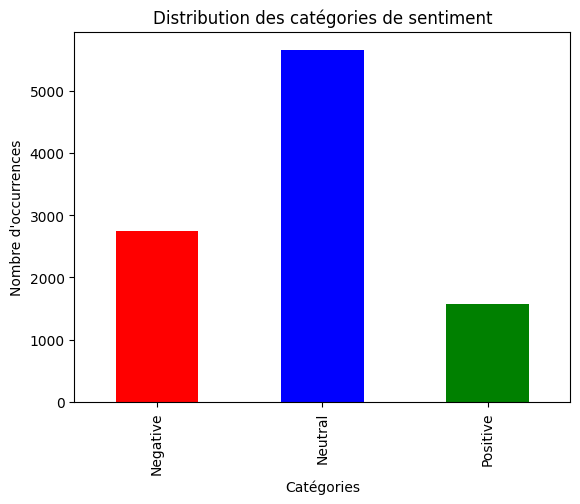

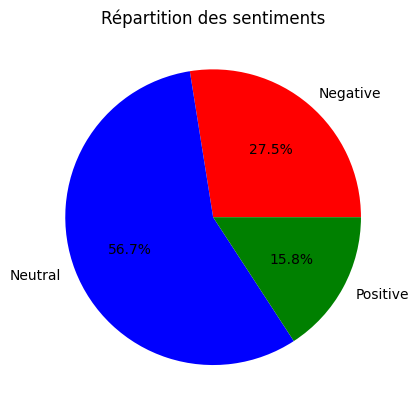

In [163]:
# Graphique à barres
counts_df['Counts'].plot(kind='bar', color=['red', 'blue', 'green'])
plt.title('Distribution des catégories de sentiment')
plt.ylabel('Nombre d\'occurrences')
plt.xlabel('Catégories')
plt.show()

# Diagramme circulaire
counts_df['Counts'].plot.pie(autopct='%1.1f%%', colors=['red', 'blue', 'green'], labels=counts_df.index)
plt.title('Répartition des sentiments')
plt.ylabel('')
plt.show()


### Pie Chart of Sentiment Counts

In [164]:
# pip install --upgrade plotly>=4.2.0

In [165]:
# pip install nbformat>=4.2.0

In [166]:

import plotly.express as px
import plotly.io as pio

# Create a Pie Chart using Plotly
fig = px.pie(counts_df, values='Counts', names=counts_df.index, 
             labels={'Category': 'Sentiment Category', 'Counts': 'Count'},
             title='Distribution of Sentiment Categories in Comments',
             hole=0.3, 
             color_discrete_sequence=px.colors.qualitative.Set1)

# Set the background color of the Pie Chart to dark grey
fig.update_layout(paper_bgcolor='darkgrey')


# Show the Plotly Pie Chart


#display(fig)
#pio.show(fig, renderer="iframe_connected")
fig.show()


In [167]:
# # Assuming counts_df is a NumPy array
# counts_df = pd.DataFrame(counts_df)

# # Replace 'sizes' with the actual column name you want to access
# sizes = list(counts_df['Counts'])

# # Assuming labels is a list of strings (replace with your actual labels)
# labels = ['negative', 'neutre', 'positive']
# # Check if sizes and labels have the same length
# if len(sizes) != len(labels):
#     raise ValueError("Sizes and labels must have the same length.")

# # Create a pie chart using matplotlib
# plt.figure(figsize=(8, 6))
# plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=['green', 'grey', 'red'])

# # Add a title
# plt.title('Distribution of Sentiment Categories in Comments', fontsize=16)

# # Equal aspect ratio ensures that the pie is drawn as a circle
# plt.axis('equal')

# # Show the plot
# plt.show()

In [168]:
# import plotly.graph_objects as go

# # Define data for the Pie Chart
# data = [
#     go.Pie(
#         labels=counts_df.index,
#         values=counts_df['Counts'],
#         hole=0.3,
#         title='Distribution of Sentiment Categories in Comments',
#         marker=dict(colors=px.colors.qualitative.Set1)
#     )
# ]

# # Define layout for the Pie Chart
# layout = go.Layout(
#     paper_bgcolor='darkgrey',
#     title='Distribution of Sentiment Categories in Comments'
# )

# # Create the figure
# fig = go.Figure(data=data, layout=layout)

# # Show the Plotly Pie Chart
# fig.show()


In [169]:
"""import matplotlib.pyplot as plt

# Données pour le graphique à secteurs
sizes = counts_df['Counts']
labels = counts_df.index

# Créer le graphique à secteurs
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Sentiment Categories in Comments')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()
"""

"import matplotlib.pyplot as plt\n\n# Données pour le graphique à secteurs\nsizes = counts_df['Counts']\nlabels = counts_df.index\n\n# Créer le graphique à secteurs\nplt.figure(figsize=(8, 8))\nplt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)\nplt.title('Distribution of Sentiment Categories in Comments')\nplt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.\nplt.show()\n"

In [170]:
df.head(2)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text,Compound,Positive,Negative,Neutral,Category
969577,l1iar2b,57,Her fucking statement makes me sick.,PublicFreakout,2024-04-27 14:56:34,1cefbwj,elboogie7,0,57,0,...,9521,0,2024-04-27 14:06:41,Her fucking statement makes me sick.,fucking statement make sick,-0.5520,0.0,0.543,0.457,Negative
1788577,kd4lsrq,61,What crime is that?,worldnews,2023-12-13 02:39:09,18h3lqi,RevolutionaryDeal238,0,61,0,...,791,0,2023-12-13 01:01:15,What crime is that?,crime,-0.5423,0.0,1.000,0.000,Negative


### Positive Score Comments

In [171]:
# Select the top 50 comments with the highest 'Compound' scores from the DataFrame
top_50_pos_comments = df.nlargest(n=50, columns=['Compound'])["clean_text"]

# This line selects the top 50 comments based on their 'Compound' scores,
# indicating the 50 comments with the most positive sentiment.


print(top_50_pos_comments)

# print top 5
# for com in top_50_pos_comments:
#     print(com, "\n")


672469     main argument seems european country werent na...
1840153    hello grandchild israeli friend many israeli p...
603719     get far perfect tell better anything else used...
77948      democrat chance honestly cant fault working cl...
566739     bet interesting opportunity india u economy ri...
2176934    honestly read oslo accord dont know fully divi...
2723       part 1 gemara concept binding power later rabb...
2041562    two type genetic study ever conducted trace or...
1108460    id say consolidate wb israel give palistine pe...
317868     dont generally fight crime committing exact cr...
1610980    rothbard converted christianity late life spen...
1754678    u model powerful military eg idf shape campaig...
1315271    happened 2022 cape town aviator life ended tra...
721434     many project like possible theyve seeded inves...
25489      potential great moment lebanon israel honest i...
1370354    people living older nakba lived palestine ww2 ...
1036035    two state sol

### Negative Score Comments

In [172]:
# Select the top 50 comments with the highest 'Compound' scores from the DataFrame
top_50_neg_comments = df.nsmallest(n=50, columns=['Compound'])["clean_text"]

print(top_50_neg_comments)

## print top 5
# for com in top_50_neg_comments:
#     print(com, "\n")

830537     gaza west bank self governed thats brutal mili...
1093831    mcmahonhussein correspondence made following 5...
388099     indictment unsealed tuesday justice department...
757390     u believe people lie raping people u believe p...
583286     protest lol show bomb next proof show protest ...
1306956    really dont understand argument truly iron dom...
1310368    youve almost walked logic little debate let he...
767210     indeed stalinist ussr horror show people alway...
1479970    someone murdered child example people felt bad...
1018455    sound exactly like destiny lmao claim arent tr...
1515496    separation bus also street hebron israeli secu...
358369     pro israeli victim mindset stab someone almost...
1373541    translation enemy think kill civilian among fi...
1993672    hamas fire crude rocket arent particularly pot...
1033966    condemn hamas action oct 7th reason frustratin...
1645663    didnt lie casualty rate track record last conf...
499878     scenario have

### Comments With High Upvotes

In [173]:
# Sort the DataFrame by 'score' in descending order and select unique 'clean_text' values
top_50_high_score_comments = df.sort_values('score', ascending=False)['clean_text'].drop_duplicates().head(50)

# This line sorts the DataFrame by 'score' in descending order, 
# selects unique 'clean_text' values, and retrieves the top 50 comments 
# with the highest scores.

print(top_50_high_score_comments)

# # print top 5
# for com in top_50_high_score_comments:
#     print(com, "\n")

978708     really promised disarm five year long take reb...
1004700    showing video next time man asks woman still p...
948880     u president joe biden referred talk sunday lea...
555751     get hurry emergency call 60 wrong side city st...
468540     thats freedom fighter extremist group get recr...
1248201    got pepper sprayed head split open mag light h...
1662047    graphic hell cover topic well want read though...
639238     human instinct help someone who hurt situation...
777201                     would think mexico enough problem
1152797    earlier post discussing general topic hamas ap...
2085554         theyre offering hostage israel close finding
439317                             look young piece shit guy
2127481    israel bring fuel hospital save life hamas fue...
1826634    hamas super effective unarmed woman child grea...
692418     thank including picture girl outfit really imp...
278847     sweating wouldnt ready face potential idf grou...
1792010                 

### Comments With Low Upvotes

In [174]:
top_50_low_score_comments = df.sort_values('score', ascending=True)['clean_text'].drop_duplicates().head(50)
print(top_50_low_score_comments)

1073091           get past germany current time need smarter
1963689                        idf business west bank anyway
594016     broken clock right twice day abysmal regime pr...
325961     nobody support hamas equating support sufferin...
275285     16000 palestinian child beeb killed since oct ...
625792     interesting see misquote thrown around another...
1294984    lol please tell arab speak arabic north africa...
475319                            least brainwashed redditor
887910     despite disgustingly diverting tone article at...
226887                  good turkey hope country follow suit
55665      actually dont live echo chamber youll see cop ...
1921555                        good bloodthirst exactly need
848485                          india way russia kudos spain
1382267    say anything critical israel must antisemite j...
2199526    like palestinian child top hamas strategist right
281685     said 50000 palestinian died since last october...
1916715    never every a

### Visualization of the Sentiment Scores of Positive, Neutral & Negative Tweets

In [175]:
df.head(2)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text,Compound,Positive,Negative,Neutral,Category
969577,l1iar2b,57,Her fucking statement makes me sick.,PublicFreakout,2024-04-27 14:56:34,1cefbwj,elboogie7,0,57,0,...,9521,0,2024-04-27 14:06:41,Her fucking statement makes me sick.,fucking statement make sick,-0.5520,0.0,0.543,0.457,Negative
1788577,kd4lsrq,61,What crime is that?,worldnews,2023-12-13 02:39:09,18h3lqi,RevolutionaryDeal238,0,61,0,...,791,0,2023-12-13 01:01:15,What crime is that?,crime,-0.5423,0.0,1.000,0.000,Negative


C:\Users\Hay Info\AppData\Local\Temp\ipykernel_14612\3568289118.py:10: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\Hay Info\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\distributions.py:2511: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\Hay Info\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype

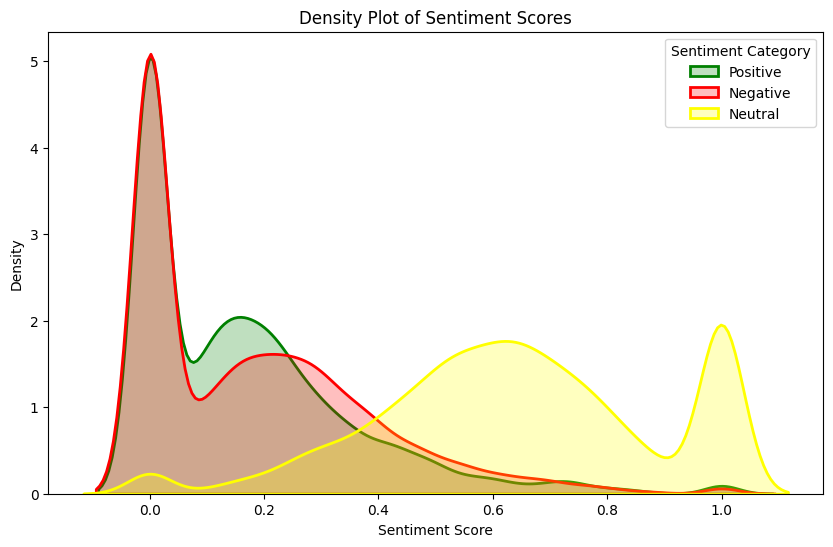

In [176]:
# Define the sentiment categories and corresponding colors
sentiment_categories = ["Positive", "Negative", "Neutral"]
colors = ['green', 'red', 'yellow']

# Set up the plot
plt.figure(figsize=(10, 6))

# Iterate over sentiment categories and plot KDE
for category, color in zip(sentiment_categories, colors):
    sns.distplot(df[category], hist=False, kde=True,
                 bins=int(180/5), color=color,
                 hist_kws={'edgecolor': 'black'},
                 kde_kws={'shade': True, 'linewidth': 2}, label=category)

# Set plot labels and legend
plt.xlabel('Sentiment Score')
plt.ylabel('Density')
plt.title('Density Plot of Sentiment Scores')
plt.legend(title='Sentiment Category')

# Show the plot
plt.show()


### Visualization of the Sentiment Scores

C:\Users\Hay Info\AppData\Local\Temp\ipykernel_14612\1808040337.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\Hay Info\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\distributions.py:2511: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\Hay Info\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype 

<Axes: xlabel='Compound', ylabel='Density'>

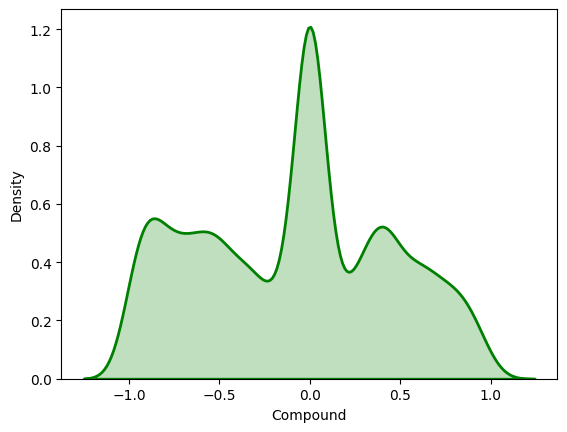

In [177]:
sns.distplot(df["Compound"], hist=False, kde=True, 
             bins=int(180/5), color = 'green', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'shade': True,'linewidth': 2})

### WordCloud of All Sentiments

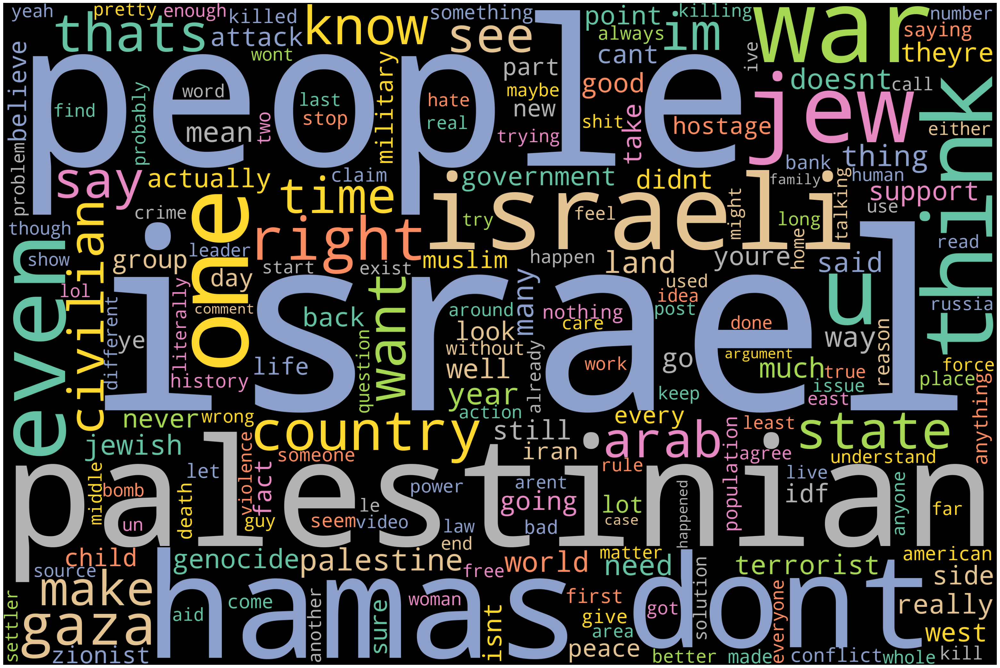

In [178]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df.clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


### WordCloud of Positive Sentiments

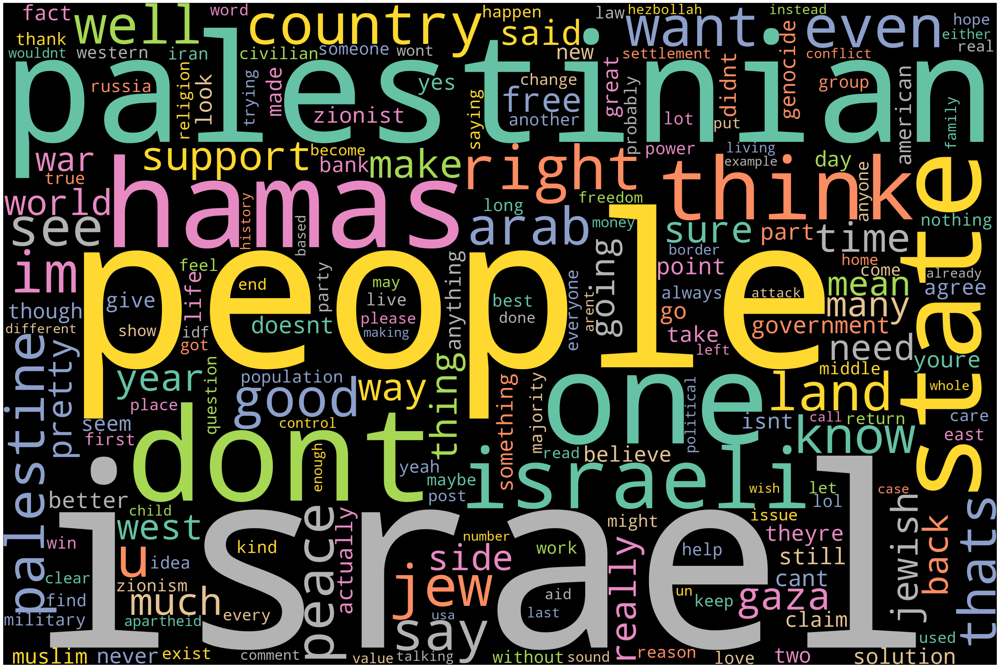

In [179]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Positive'].clean_text)
                                            
# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


### WordCloud of Neutral Sentiments

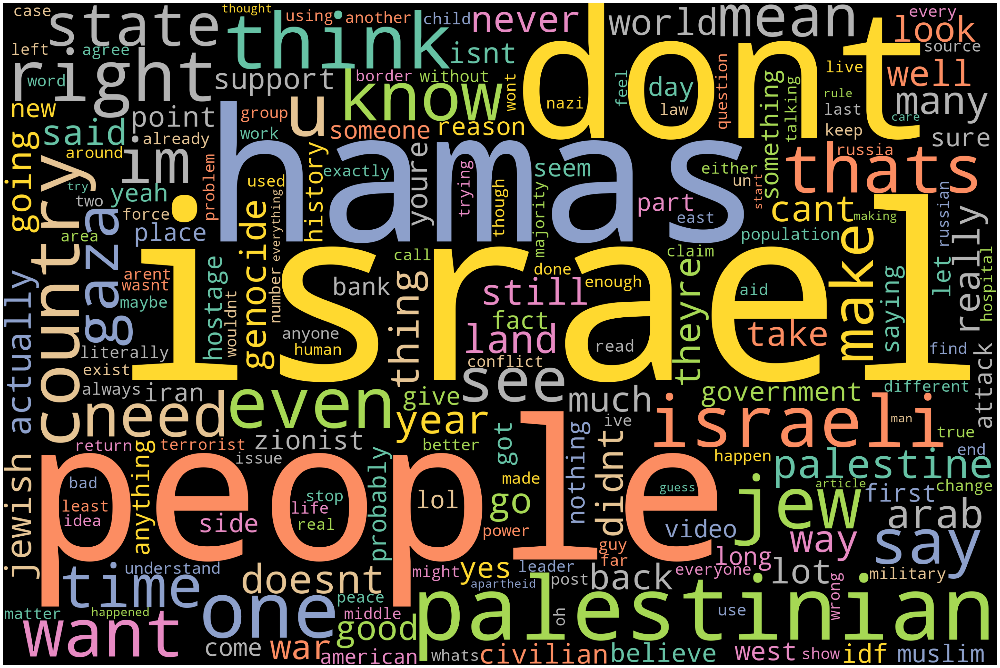

In [180]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Neutral'].clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


### WordCloud of Negative Sentiments

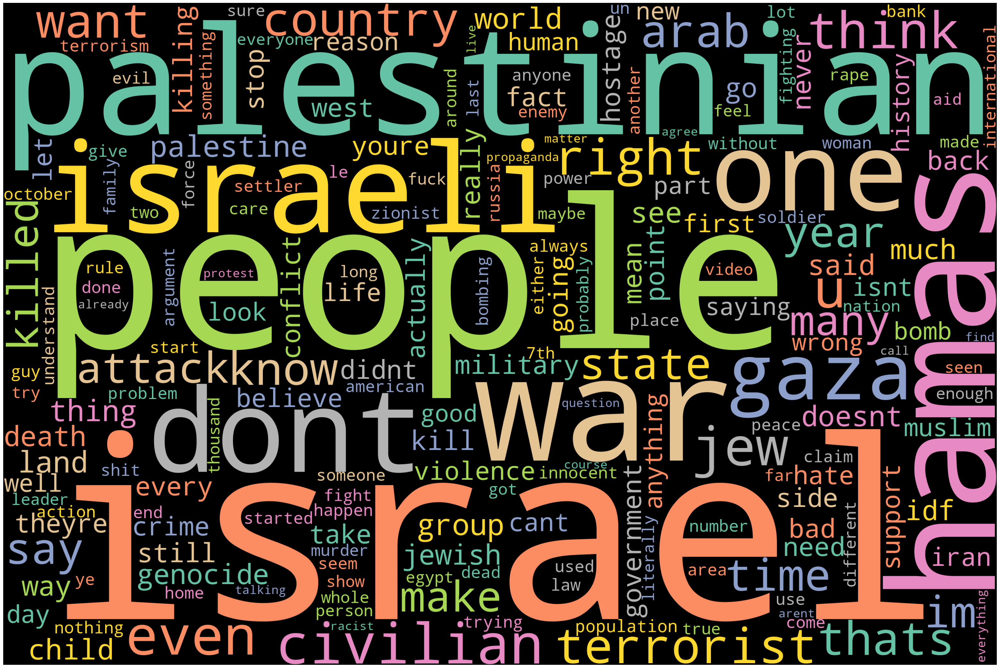

In [181]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Negative'].clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


In [182]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10000 entries, 969577 to 946338
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   comment_id                  10000 non-null  object 
 1   score                       10000 non-null  int64  
 2   self_text                   10000 non-null  object 
 3   subreddit                   10000 non-null  object 
 4   created_time                10000 non-null  object 
 5   post_id                     10000 non-null  object 
 6   author_name                 10000 non-null  object 
 7   controversiality            10000 non-null  int64  
 8   ups                         10000 non-null  int64  
 9   downs                       10000 non-null  int64  
 10  user_is_verified            10000 non-null  object 
 11  user_account_created_time   9552 non-null   object 
 12  user_awardee_karma          9996 non-null   float64
 13  user_awarder_karma          99

In [183]:
df.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text,Compound,Positive,Negative,Neutral,Category
969577,l1iar2b,57,Her fucking statement makes me sick.,PublicFreakout,2024-04-27 14:56:34,1cefbwj,elboogie7,0,57,0,...,9521,0,2024-04-27 14:06:41,Her fucking statement makes me sick.,fucking statement make sick,-0.5520,0.000,0.543,0.457,Negative
1788577,kd4lsrq,61,What crime is that?,worldnews,2023-12-13 02:39:09,18h3lqi,RevolutionaryDeal238,0,61,0,...,791,0,2023-12-13 01:01:15,What crime is that?,crime,-0.5423,0.000,1.000,0.000,Negative
594469,lcr4hv2,12,"Geez, an injury like that in a major muscle th...",PublicFreakout,2024-07-11 23:21:40,1e0w4ae,Destination_Centauri,0,12,0,...,9289,0,2024-07-11 18:34:48,"Geez, an injury like that in a major muscle th...",geez injury like major muscle support body wei...,-0.4215,0.184,0.217,0.599,Neutral
1156150,kwlt1jz,1,People being mean isn’t something he’s going t...,IsraelPalestine,2024-03-26 06:00:27,1bms1c5,djentkittens,0,1,0,...,94,0,2024-03-24 18:45:25,People being mean isn’t something he’s going t...,people mean isnt something he going issue unle...,0.4404,0.244,0.000,0.756,Neutral
1400941,kptoxom,-17,"Hahah! Japan can gtfo, along with the rest of ...",worldnews,2024-02-10 19:55:52,1angnzb,LordTyrant,0,-17,0,...,1741,0,2024-02-10 13:45:52,"Hahah! Japan can gtfo, along with the rest of ...",hahah japan gtfo along rest west puppet arent ...,-0.6908,0.000,0.289,0.711,Negative


# Positive or Negative Bias Detection

In [184]:
# Calculate the average sentiment scores for each subreddit
subreddit_sentiment = df.groupby('subreddit')[['Positive', 'Negative']].mean()

# Calculate the difference between positive and negative sentiment scores
subreddit_sentiment['Bias'] = subreddit_sentiment['Positive'] - subreddit_sentiment['Negative']

# Determine the direction of bias: Positive, Negative, or Neutral
def determine_bias_direction(bias):
    if bias > 0.01:  # You can adjust this threshold based on your dataset
        return 'Positive'
    elif bias < -0.01:  # You can adjust this threshold based on your dataset
        return 'Negative'
    else:
        return 'Neutral'

subreddit_sentiment['Bias Direction'] = subreddit_sentiment['Bias'].apply(determine_bias_direction)

# Sort subreddits based on bias in descending order
most_biased_subreddits = subreddit_sentiment.sort_values(by='Bias', ascending=False)

# Print or view the most biased subreddits with bias direction
print(most_biased_subreddits)


                       Positive  Negative      Bias Bias Direction
subreddit                                                         
NonCredibleDefense     0.152977  0.130942  0.022036       Positive
CombatFootage          0.174886  0.157968  0.016919       Positive
Palestine              0.185642  0.183175  0.002467        Neutral
ActualPublicFreakouts  0.154826  0.156326 -0.001500        Neutral
CrazyFuckingVideos     0.161456  0.167377 -0.005921        Neutral
worldnews              0.163067  0.174602 -0.011536       Negative
AskMiddleEast          0.159853  0.173838 -0.013985       Negative
TerrifyingAsFuck       0.122740  0.147320 -0.024580       Negative
AbruptChaos            0.139167  0.164333 -0.025167       Negative
PublicFreakout         0.161167  0.186489 -0.025322       Negative
worldnewsvideo         0.175154  0.200652 -0.025499       Negative
IsraelPalestine        0.160646  0.187296 -0.026650       Negative
IsrealPalestineWar_23  0.146547  0.200593 -0.054047       Nega

C:\Users\Hay Info\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\Hay Info\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\Hay Info\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



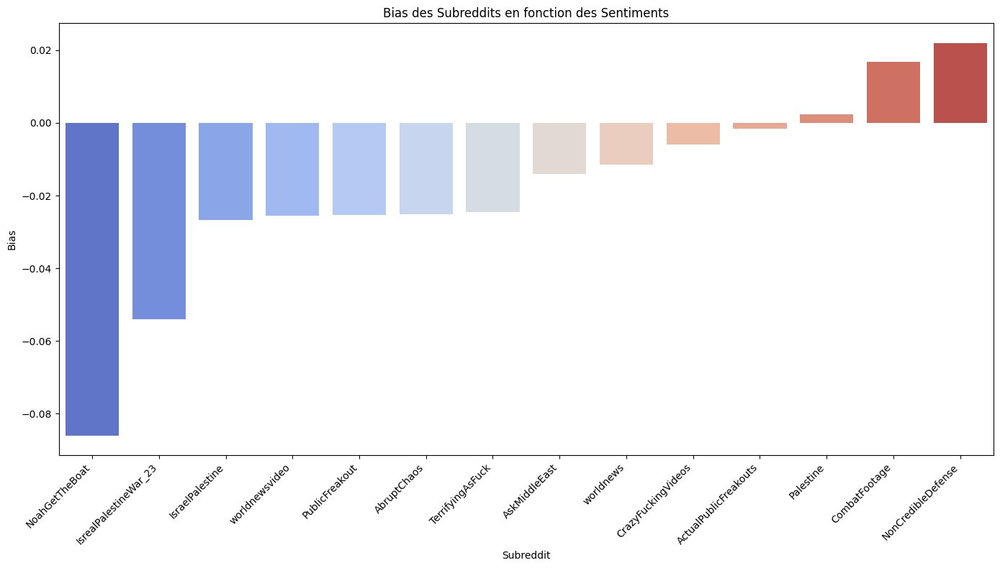

In [185]:
import matplotlib.pyplot as plt
import seaborn as sns

# Trier le DataFrame par 'Bias' pour faciliter la visualisation
most_biased_subreddits = most_biased_subreddits.sort_values(by='Bias', ascending=True)

# Configurer la taille de la figure
plt.figure(figsize=(14, 8))

# Tracer les barres pour le 'Bias'
sns.barplot(x=most_biased_subreddits.index, y='Bias', data=most_biased_subreddits, palette='coolwarm')

# Ajouter des labels et un titre
plt.xlabel('Subreddit')
plt.ylabel('Bias')
plt.title('Bias des Subreddits en fonction des Sentiments')
plt.xticks(rotation=45, ha='right')  # Rotation des étiquettes pour une meilleure lisibilité

# Afficher le graphique
plt.tight_layout()
plt.show()


In [186]:
# # Step 3: Topic Modeling
# vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
# tfidf_matrix = vectorizer.fit_transform(df['clean_text'])
# lda_model = LatentDirichletAllocation(n_components=5, random_state=42, n_jobs=-1)  # Assuming 5 topics
# lda_topic_matrix = lda_model.fit_transform(tfidf_matrix)

In [187]:
vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['clean_text'])
# Number of iterations for partial fitting
num_iterations = 10  # Choisissez un nombre d'itérations pour l'entraînement progressif

# Initialiser le modèle LDA
lda_model = LatentDirichletAllocation(n_components=5, random_state=42, n_jobs=-1)

# Fractionner la matrice TF-IDF en morceaux et entraîner le modèle progressivement
batch_size = int(tfidf_matrix.shape[0] / num_iterations)
for i in tqdm(range(num_iterations), desc="Training LDA"):
    start_idx = i * batch_size
    end_idx = min((i + 1) * batch_size, tfidf_matrix.shape[0])
    lda_model.partial_fit(tfidf_matrix[start_idx:end_idx])

# Ajuster le modèle avec la dernière partie (si nécessaire)
if end_idx < tfidf_matrix.shape[0]:
    lda_model.partial_fit(tfidf_matrix[end_idx:])

# Obtenir les matrices de distribution pour chaque document
lda_topic_matrix = lda_model.transform(tfidf_matrix)


Training LDA: 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


In [188]:
# !pip install gensim

In [189]:
from gensim.models import CoherenceModel
import numpy as np

# Convertir la matrice TF-IDF en un format utilisable par Gensim
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim.corpora as corpora
import gensim

# Préparer le corpus de Gensim
id2word = corpora.Dictionary([doc.split() for doc in df['clean_text']])
corpus = [id2word.doc2bow(doc.split()) for doc in df['clean_text']]

# Entraîner un modèle LDA avec Gensim
lda_gensim = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=5, passes=15, random_state=42)

# Calcul de la cohérence
coherence_model_lda = CoherenceModel(model=lda_gensim, texts=[doc.split() for doc in df['clean_text']], dictionary=id2word, coherence='c_v')
coherence_score = coherence_model_lda.get_coherence()
print(f"Cohérence du modèle LDA : {coherence_score}")


Cohérence du modèle LDA : 0.5200843731026505


In [190]:
# Afficher la perplexité (ce n'est pas une boucle, donc pas besoin de tqdm ici)
print(f"Perplexité : {lda_model.perplexity(tfidf_matrix)}")

Perplexité : 24287.19514953208


# Topic Modelling

In [191]:
# Get the feature names (words) from the vectorizer
feature_names = vectorizer.get_feature_names_out()

# Get the top words for each topic
n_top_words = 10  # You can adjust this number to display more or fewer words per topic
top_words_per_topic = []
for topic_idx, topic in enumerate(lda_model.components_):
    top_words_idx = topic.argsort()[:-n_top_words - 1:-1]
    top_words = [feature_names[i] for i in top_words_idx]
    top_words_per_topic.append(top_words)

# Print the topics and associated words
for topic_idx, top_words in enumerate(top_words_per_topic):
    print(f"Topic #{topic_idx + 1}:")
    print(", ".join(top_words))
    print()


Topic #1:
look, theyre, like, dont, fuck, need, kid, yeah, fucking, thats

Topic #2:
hostage, yes, exactly, west, bank, man, im, sure, israeli, really

Topic #3:
lol, hamas, source, wrong, video, think, war, civilian, question, israel

Topic #4:
israel, palestinian, hamas, people, want, terrorist, dont, gaza, state, think

Topic #5:
jew, arab, iran, palestine, war, free, bomb, like, palestinian, israel



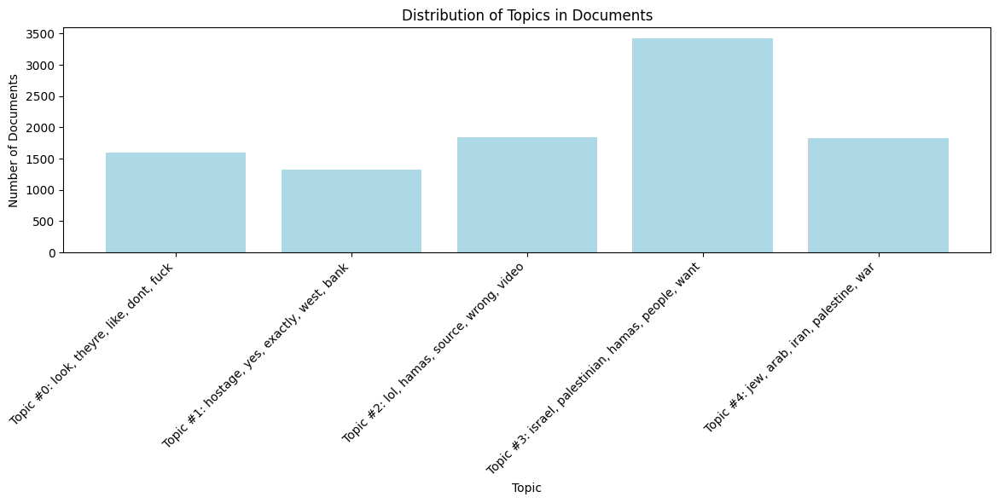

In [192]:
import numpy as np
import matplotlib.pyplot as plt

# Calculer la distribution des sujets dans les documents avec tqdm
topic_counts = np.argmax(lda_topic_matrix, axis=1)

# Obtenir les termes dominants pour chaque sujet
topic_labels = []
for topic_idx, topic in enumerate(lda_model.components_):
    top_terms = [vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-6:-1]]  # Choisir les 5 termes les plus importants
    topic_labels.append(f"Topic #{topic_idx}: {', '.join(top_terms)}")

# Tracer l'histogramme avec les noms des sujets
plt.figure(figsize=(12, 6))
plt.hist(topic_counts, bins=np.arange(lda_model.n_components + 1) - 0.5, rwidth=0.8, color='lightblue')

# Ajouter des étiquettes aux axes
plt.xlabel('Topic')
plt.ylabel('Number of Documents')
plt.title('Distribution of Topics in Documents')

# Ajouter des labels significatifs pour les sujets
plt.xticks(ticks=np.arange(lda_model.n_components), labels=topic_labels, rotation=45, ha='right')

plt.tight_layout()  # Ajuster la mise en page pour éviter le chevauchement des étiquettes
plt.show()


In [193]:
# Get the vocabulary indices for 'israel' and 'palestine' in your vectorizer
israel_word_index = vectorizer.vocabulary_['israel']
palestine_word_index = vectorizer.vocabulary_['palestine']

In [194]:
topic_term_distribution = lda_model.components_

In [195]:
israel_topic_index = topic_term_distribution[:, israel_word_index].argmax()
palestine_topic_index = topic_term_distribution[:, palestine_word_index].argmax()

# Geopolitical Stance Determination Using Dominant Topics and Sentiment Scores

In [196]:
from tqdm import tqdm
tqdm.pandas()  # Active le suivi de progression dans pandas

# Define the function to determine geopolitical stance
def determine_geopolitical_stance(row):
    sentiment_score = row['Compound']
    topic_distribution = lda_model.transform(vectorizer.transform([row['clean_text']]))[0]
    
    # Determine stance based on sentiment score and dominant topic
    if sentiment_score <= -0.5:
        return 'Against Israel/Palestine'
    elif sentiment_score >= 0.5 and topic_distribution.argmax() == israel_topic_index:
        return 'Supports Israel'
    elif sentiment_score >= 0.5 and topic_distribution.argmax() == palestine_topic_index:
        return 'Supports Palestine'
    else:
        return 'Neutral/Stance Not Clear'

# Apply the function to the DataFrame with progress tracking
df['geopolitical_stance'] = df.progress_apply(determine_geopolitical_stance, axis=1)

100%|██████████| 10000/10000 [02:34<00:00, 64.84it/s]


In [197]:
stance_counts = df['geopolitical_stance'].value_counts()
print("Geopolitical Stance Distribution:")
stance_counts

Geopolitical Stance Distribution:


geopolitical_stance
Neutral/Stance Not Clear    6368
Against Israel/Palestine    2752
Supports Israel              569
Supports Palestine           311
Name: count, dtype: int64

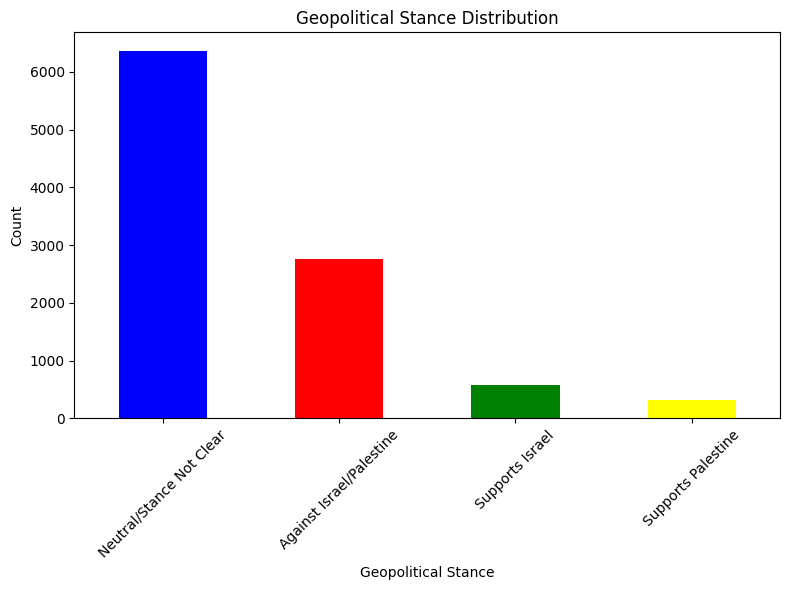

In [198]:
# Assuming 'geopolitical_stance' is a column in your DataFrame df
stance_counts = df['geopolitical_stance'].value_counts()

# Create bar chart using DataFrame values
plt.figure(figsize=(8, 6))
stance_counts.plot(kind='bar', color=['blue', 'red', 'green', 'yellow'])
plt.xlabel('Geopolitical Stance')
plt.ylabel('Count')
plt.title('Geopolitical Stance Distribution')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()

# Show the chart
plt.show()

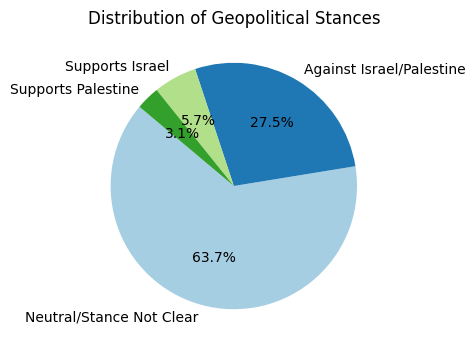

In [199]:
# Tracer le pie chart avec les pourcentages
plt.figure(figsize=(6, 4))
plt.pie(stance_counts, labels=stance_counts.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)

# Ajouter le titre
plt.title('Distribution of Geopolitical Stances')
plt.show()

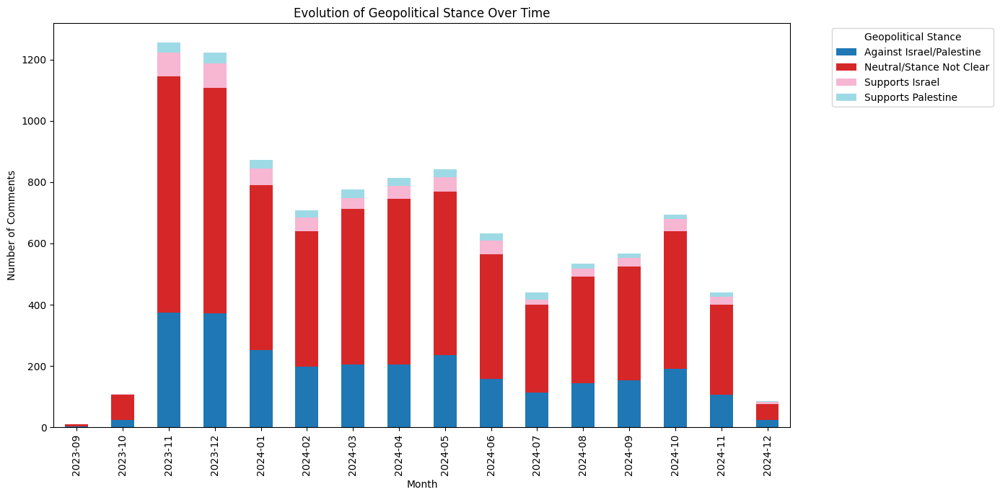

In [200]:
import pandas as pd
import matplotlib.pyplot as plt

# Assurez-vous que la colonne 'date' est de type datetime
df['created_time'] = pd.to_datetime(df['created_time'])  # Modifier pour utiliser la colonne correcte

# Extraire le mois et l'année de la date
df['month'] = df['created_time'].dt.to_period('M')

# Grouper par mois et par position géopolitique, et compter les occurrences
monthly_stance_counts = df.groupby(['month', 'geopolitical_stance']).size().unstack(fill_value=0)

# Tracer l'évolution dans le temps
plt.figure(figsize=(14, 7))
monthly_stance_counts.plot(kind='bar', stacked=True, colormap='tab20', ax=plt.gca())

# Ajouter des labels et un titre
plt.xlabel('Month')
plt.ylabel('Number of Comments')
plt.title('Evolution of Geopolitical Stance Over Time')
plt.legend(title='Geopolitical Stance', bbox_to_anchor=(1.05, 1), loc='upper left')

# Afficher le graphique
plt.tight_layout()
plt.show()


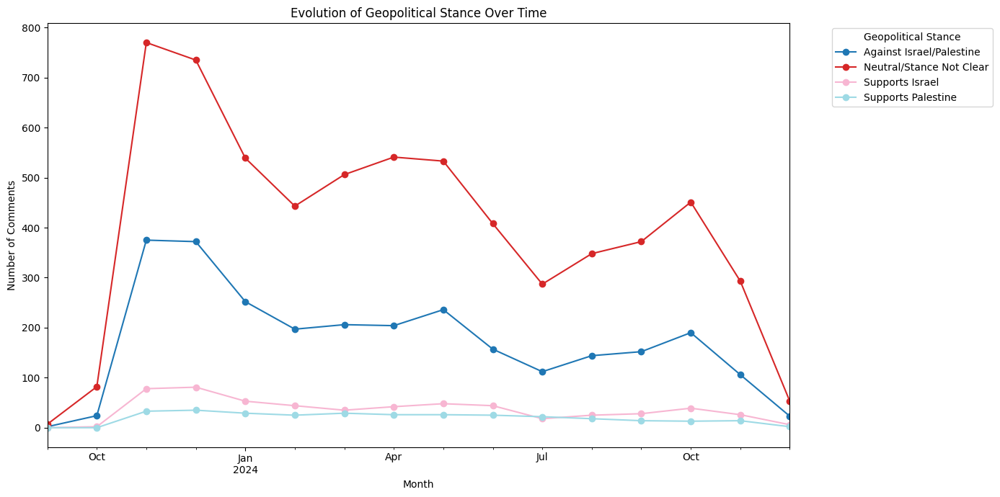

In [202]:
import pandas as pd
import matplotlib.pyplot as plt

# Assurez-vous que la colonne 'date' est de type datetime
df['created_time'] = pd.to_datetime(df['created_time'])  # Modifier pour utiliser la colonne correcte

# Extraire le mois et l'année de la date
df['month'] = df['created_time'].dt.to_period('M')

# Grouper par mois et par position géopolitique, et compter les occurrences
monthly_stance_counts = df.groupby(['month', 'geopolitical_stance']).size().unstack(fill_value=0)

# Tracer l'évolution dans le temps avec un graphique en lignes
plt.figure(figsize=(14, 7))
monthly_stance_counts.plot(kind='line', marker='o', ax=plt.gca(), colormap='tab20')

# Ajouter des labels et un titre
plt.xlabel('Month')
plt.ylabel('Number of Comments')
plt.title('Evolution of Geopolitical Stance Over Time')
plt.legend(title='Geopolitical Stance', bbox_to_anchor=(1.05, 1), loc='upper left')

# Afficher le graphique
plt.tight_layout()
plt.show()


In [201]:
df.columns

Index(['comment_id', 'score', 'self_text', 'subreddit', 'created_time',
       'post_id', 'author_name', 'controversiality', 'ups', 'downs',
       'user_is_verified', 'user_account_created_time', 'user_awardee_karma',
       'user_awarder_karma', 'user_link_karma', 'user_comment_karma',
       'user_total_karma', 'post_score', 'post_self_text', 'post_title',
       'post_upvote_ratio', 'post_thumbs_ups', 'post_total_awards_received',
       'post_created_time', 'self_text_str', 'clean_text', 'Compound',
       'Positive', 'Negative', 'Neutral', 'Category', 'geopolitical_stance',
       'month'],
      dtype='object')

### Geopolitical Stance Distribution:

- **Neutral/Stance Not Clear:** The majority of the data falls into this category with a count of 286,000. This suggests that a significant portion of the dataset does not express a clear geopolitical stance on the Israel-Palestine issue.

- **Against Israel/Palestine:** There are 123,092 instances where the stance is against Israel/Palestine. This indicates a substantial portion of the data expressing a negative sentiment or opposition towards Israel, Palestine, or both.

- **Supports Palestine:** There are 13,911 instances where the stance supports Palestine. This represents a smaller but notable segment of the data that expresses support for the Palestinian side of the conflict.

- **Supports Israel:** There are 13,722 instances where the stance supports Israel. Similar to supporting Palestine, supporting Israel is also expressed by a smaller but significant portion of the dataset.

In summary, the majority of the data does not express a clear stance. Among those that do, there is a considerable diversity of opinions, with a slightly higher number of instances leaning against Israel/Palestine.


# Inferences

### **Why Neutral or Unclear Stance is Disturbing:**

1. **Humanitarian Crisis:** The war has led to a significant humanitarian crisis, with a large number of civilian casualties, including children. A neutral stance might indicate a lack of active engagement for a peaceful resolution, potentially perpetuating the crisis.

2. **Potential for Change:** A neutral stance might imply a failure to actively work towards a resolution. With so many lives at stake, not actively supporting efforts for peace could be seen as a missed opportunity to make a positive impact.

3. **Moral Responsibility:** Some argue that in the face of significant human suffering, individuals and nations have a moral responsibility to take a stand against violence and advocate for peaceful solutions. A neutral stance might be perceived as shirking this responsibility.

4. **Perpetuation of War:** A lack of active engagement might inadvertently support the status quo, allowing the war to continue without significant international pressure for resolution. This can lead to more lives being lost and the prolongation of suffering.

5. **Missed Opportunities for Diplomacy:** International pressure and diplomacy can play a crucial role in war resolution. By not picking a side, opportunities for diplomatic efforts and negotiations might be missed, hindering the chances of finding a peaceful resolution.

6. **Failure to Address Root Causes:** Taking a neutral stance means avoiding addressing the underlying issues that fuel the war, such as territorial disputes and human rights violations. Without addressing these root causes, long-term peace and stability are impossible to achieve.

7. **Lack of Moral Clarity:** In situations with clear human rights violations, a neutral stance cab be seen as a lack of moral clarity and a failure to stand up against injustice.

In summary, a neutral or complacent stance in the Israel-Palestine war might be perceived as problematic because it can contribute to the continuation of the war and the suffering of those involved. Many advocate for active engagement, dialogue, and efforts toward a peaceful resolution to prevent further loss of lives, especially among vulnerable populations like children.
